# Download dataset

[link to dataset](https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/)

In [ ]:
!wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300-images.tgz
# !wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300-human.tgz

--2025-05-15 14:40:28--  https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300-images.tgz
Resolving www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)... 128.32.244.190
Connecting to www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22211847 (21M) [application/x-tar]
Saving to: ‘BSDS300-images.tgz’

BSDS300-images.tgz  100%[===================>]  21.18M  17.9MB/s    in 1.2s    

2025-05-15 14:40:29 (17.9 MB/s) - ‘BSDS300-images.tgz’ saved [22211847/22211847]



In [ ]:
# !tar -xvzf BSDS300-human.tgz
!tar -xvzf BSDS300-images.tgz


BSDS300/images/
BSDS300/images/train/
BSDS300/images/train/159029.jpg
BSDS300/images/train/20008.jpg
BSDS300/images/train/155060.jpg
BSDS300/images/train/286092.jpg
BSDS300/images/train/100075.jpg
BSDS300/images/train/61060.jpg
BSDS300/images/train/46076.jpg
BSDS300/images/train/301007.jpg
BSDS300/images/train/26031.jpg
BSDS300/images/train/232038.jpg
BSDS300/images/train/45077.jpg
BSDS300/images/train/365025.jpg
BSDS300/images/train/188091.jpg
BSDS300/images/train/299091.jpg
BSDS300/images/train/181079.jpg
BSDS300/images/train/22090.jpg
BSDS300/images/train/370036.jpg
BSDS300/images/train/15088.jpg
BSDS300/images/train/22093.jpg
BSDS300/images/train/376020.jpg
BSDS300/images/train/187071.jpg
BSDS300/images/train/105053.jpg
BSDS300/images/train/271008.jpg
BSDS300/images/train/277095.jpg
BSDS300/images/train/198023.jpg
BSDS300/images/train/65074.jpg
BSDS300/images/train/189003.jpg
BSDS300/images/train/187029.jpg
BSDS300/images/train/103041.jpg
BSDS300/images/train/163014.jpg
BSDS300/ima

# Imports

In [ ]:
from matplotlib import pyplot as plt
from multiprocessing import Pool, cpu_count
from tqdm.autonotebook import tqdm
import numpy as np
from pathlib import Path
import os
import glob
import os
import cv2
from numba import cuda

<ipython-input-25-813501589442>:3: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
train_images = glob.glob("/content/BSDS300/images/train/*.jpg")
test_images  = glob.glob("/content/BSDS300/images/test/*.jpg")


In [ ]:
print(f"total train images = {len(train_images)}")
print(f"total test images  = {len(test_images)}")


total train images = 200
total test images  = 100


# Exploratory data analysis

## Visualise few train and test images

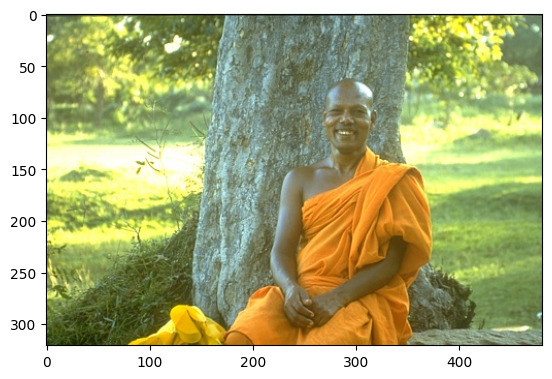

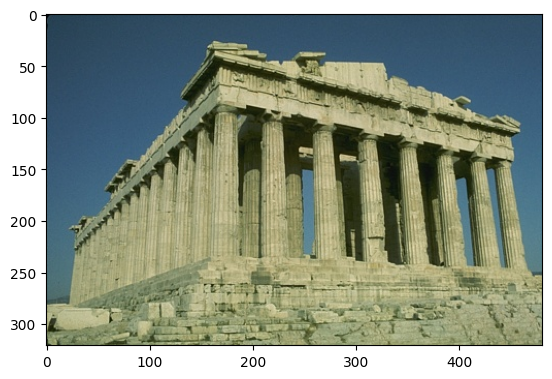

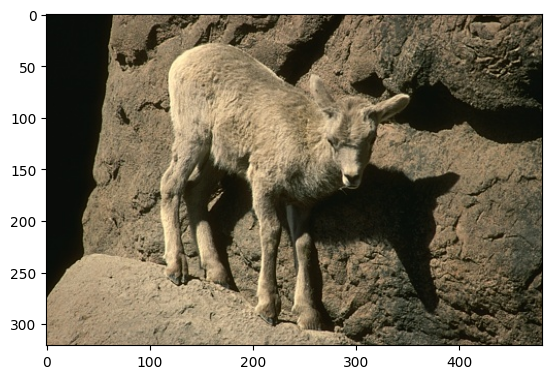

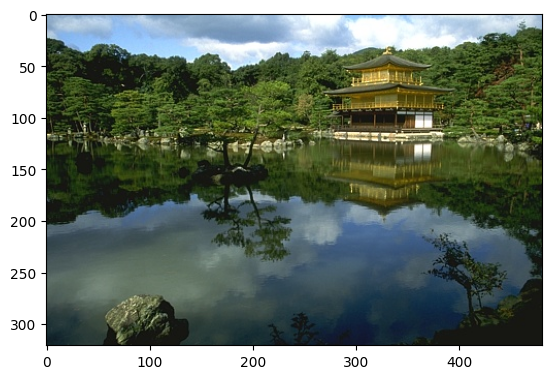

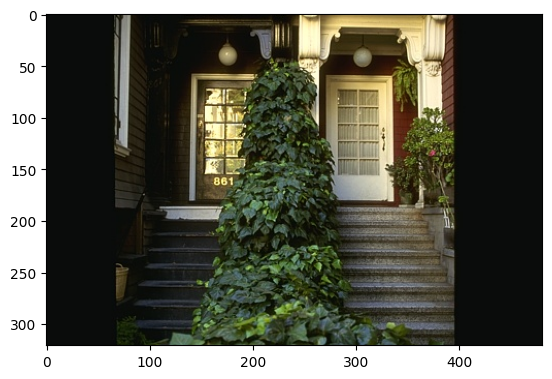

In [ ]:
for train_image in train_images[0:5]:
    plt.imshow(cv2.imread(train_image)[:,:,::-1])
    plt.show()

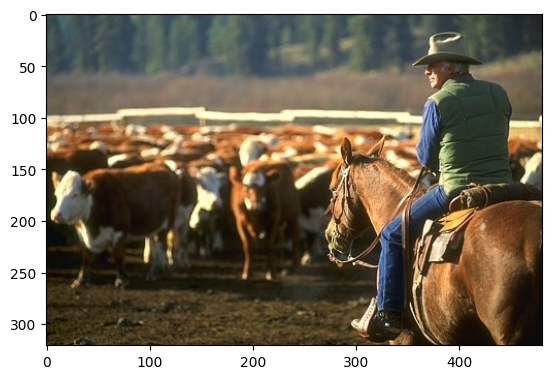

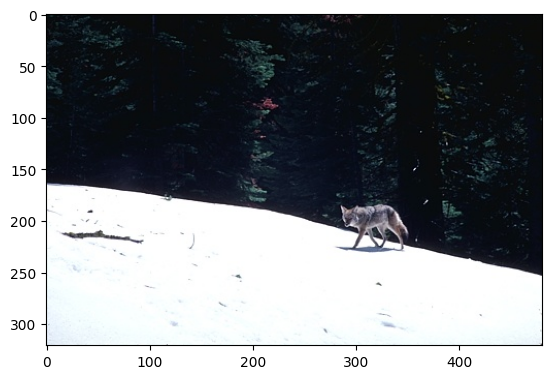

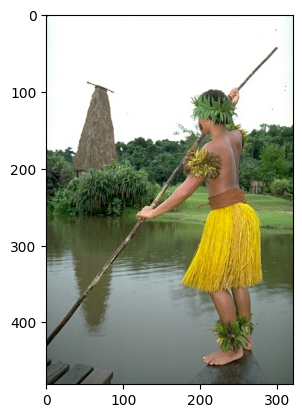

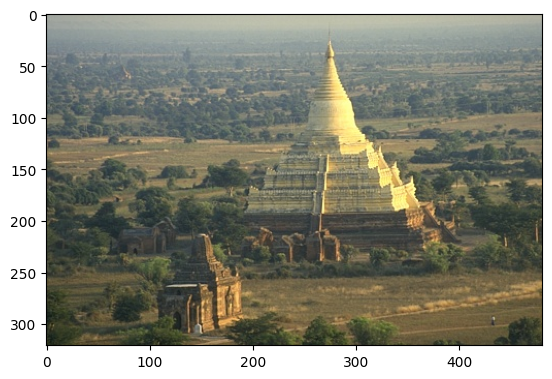

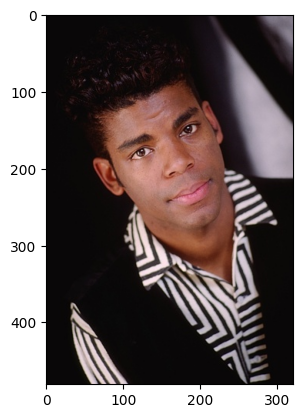

In [ ]:
for test_image in test_images[0:5]:
    plt.imshow(cv2.imread(test_image)[:,:,::-1])
    plt.show()

**Observations**:-
* images are general images with good resolution
* but have diffrent aspect ratio

## analyse train and test images length , width and channel

In [ ]:
def analyse_lwc(images):
    length = []
    width = []
    channel = []

    for image in images:
        img = cv2.imread(image)
        length.append(img.shape[0])
        width.append(img.shape[1])
        channel.append(img.shape[2])

    print(f"unique lengths = {np.unique(length)}")
    print(f"unique widths = {np.unique(width)}")
    print(f"unique channels = {np.unique(channel)}")

    plt.hist(length)
    plt.title("length")
    plt.show()

    plt.hist(width)
    plt.title("width")
    plt.show()

    plt.hist(channel)
    plt.title("channel")
    plt.show()



unique lengths = [321 481]
unique widths = [321 481]
unique channels = [3]


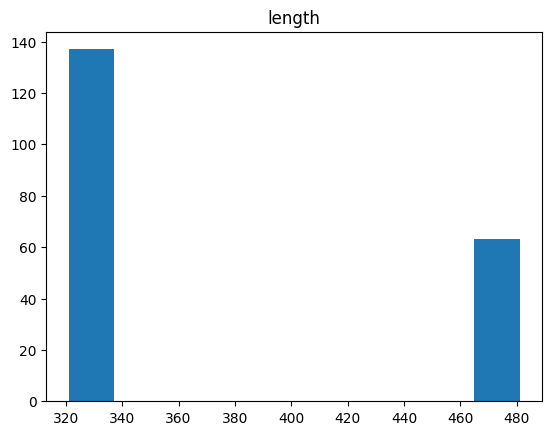

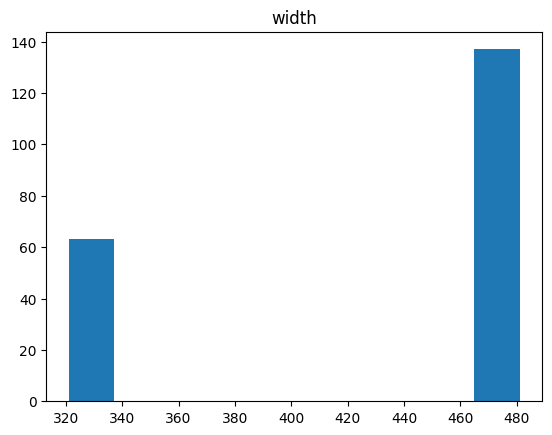

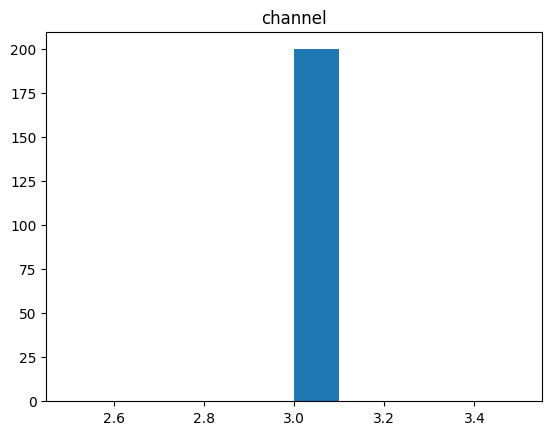

In [ ]:
analyse_lwc(train_images)

unique lengths = [321 481]
unique widths = [321 481]
unique channels = [3]


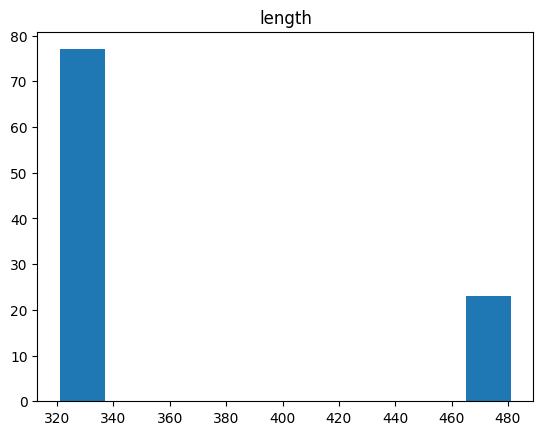

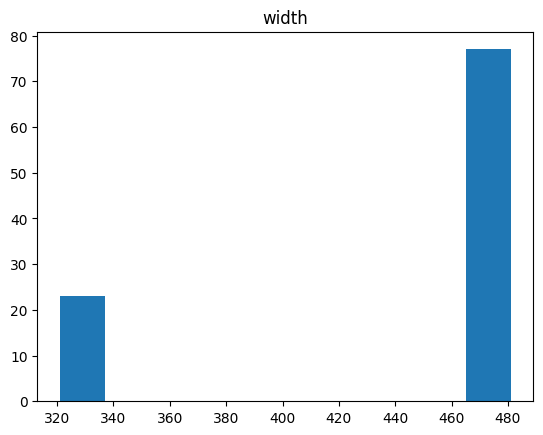

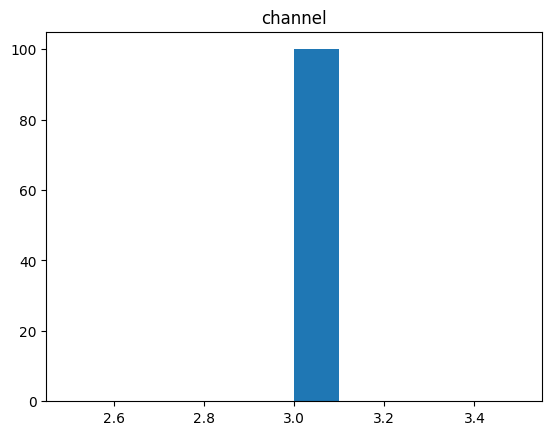

In [ ]:
analyse_lwc(test_images)

**Observation**:-
* height is either 321 or 481 and vice versa for width

## RGB vs YCbCr

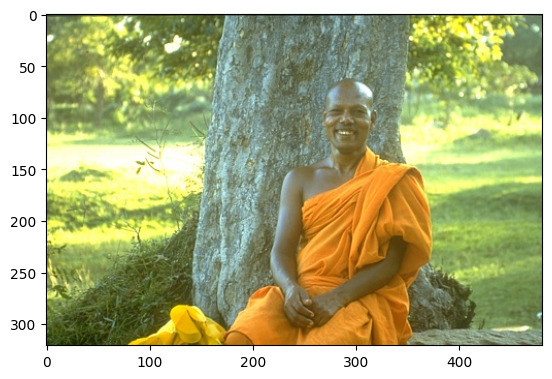

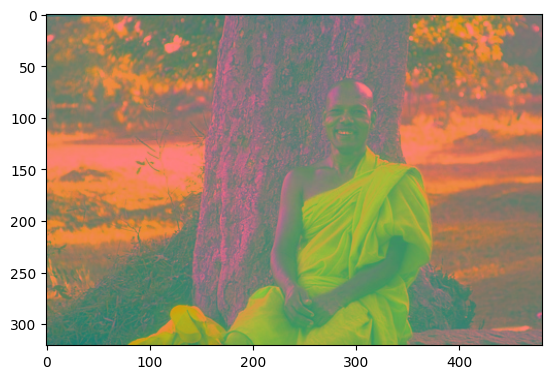

In [ ]:
img = cv2.imread(train_images[0])
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
imgYCC = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

plt.imshow(imgRGB)
plt.show()

plt.imshow(imgYCC)
plt.show()

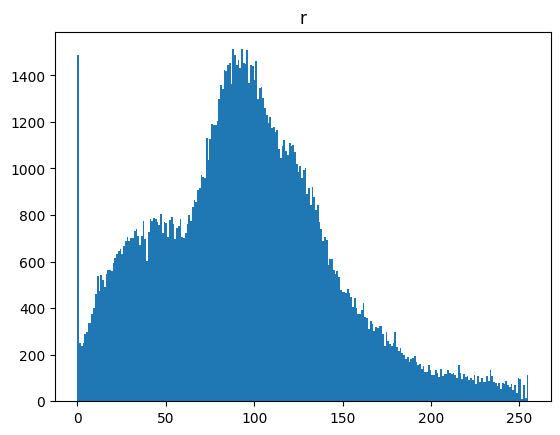

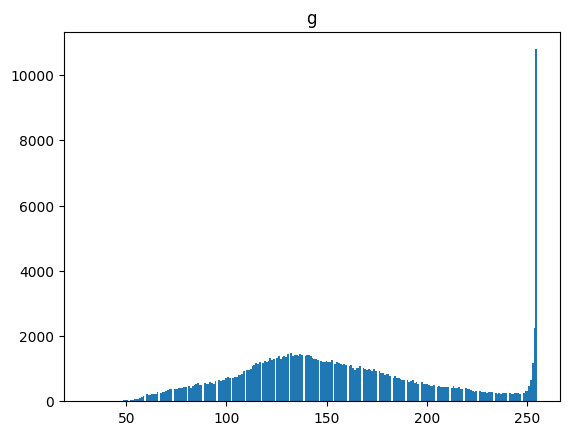

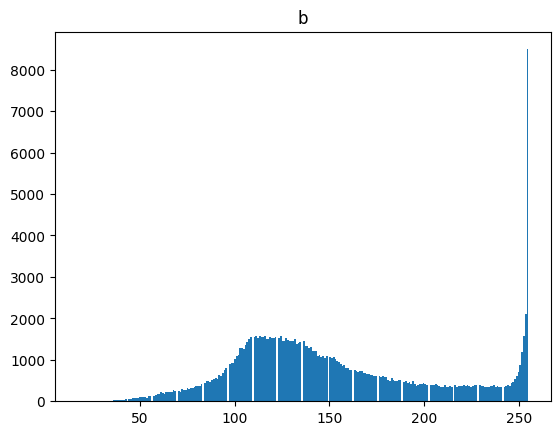

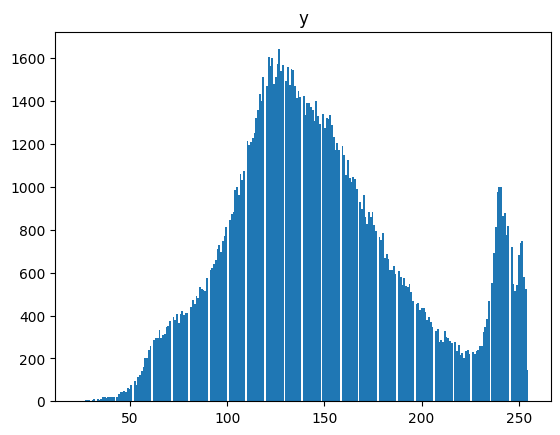

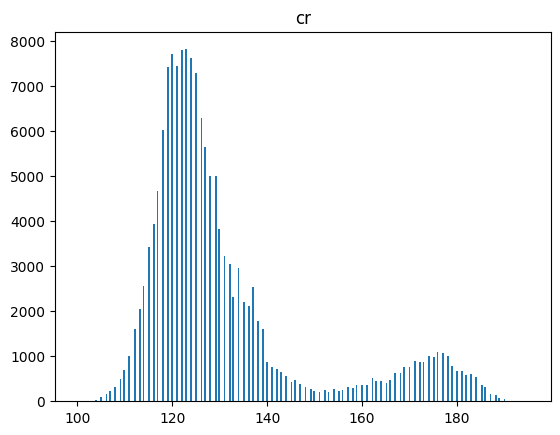

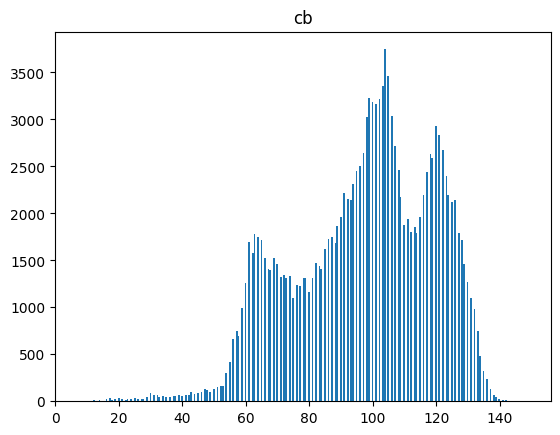

In [ ]:
r = img[:,:,0]
g = img[:,:,1]
b = img[:,:,2]

y = imgYCC[:,:,0]
cr = imgYCC[:,:,1]
cb = imgYCC[:,:,2]

plt.hist(r.flatten(), bins=256)
plt.title("r")
plt.show()

plt.hist(g.flatten(), bins=256)
plt.title("g")
plt.show()

plt.hist(b.flatten(), bins=256)
plt.title("b")
plt.show()

plt.hist(y.flatten(), bins=256)
plt.title("y")
plt.show()

plt.hist(cr.flatten(), bins=256)
plt.title("cr")
plt.show()

plt.hist(cb.flatten(), bins=256)
plt.title("cb")
plt.show()

**Observations**:-
* YCbCr have diffrent range as compared to RGB

# Create train and test dataset for model as per research paper

[page 6 of research paper](https://arxiv.org/pdf/1501.00092v3)

```
The size of training sub-images is
fsub = 33. Thus the 91-image dataset can be decomposed
into 24,800 sub-images, which are extracted from original images with a stride of 14.
```

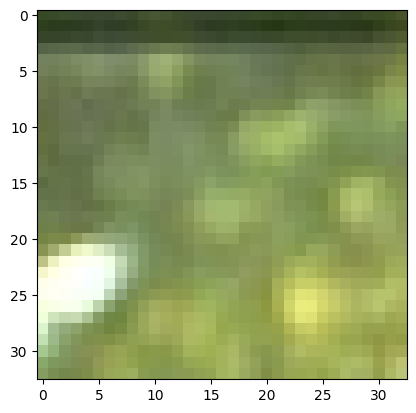

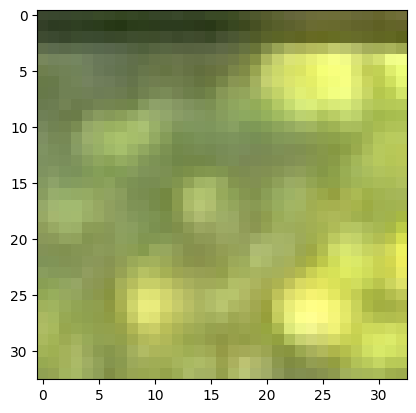

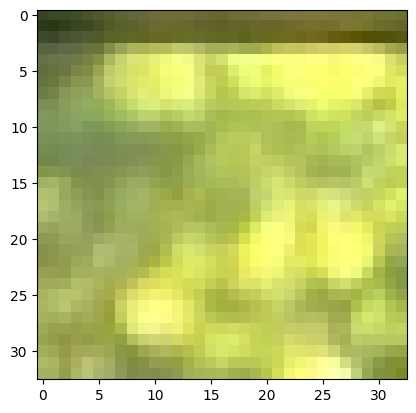

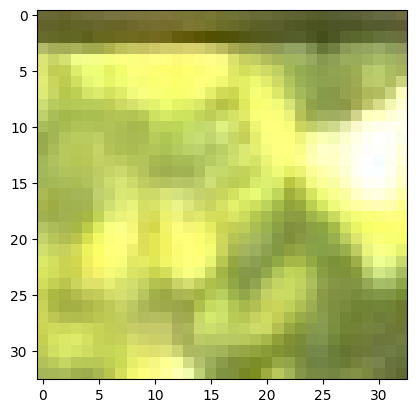

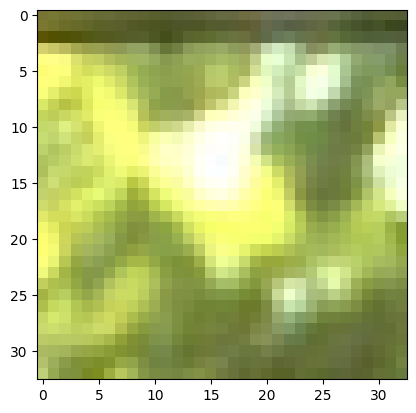

...

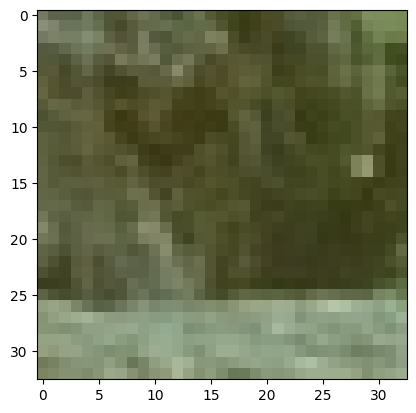

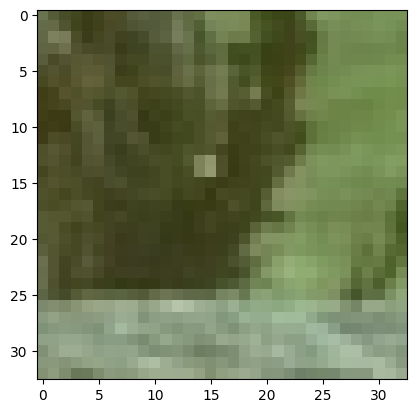

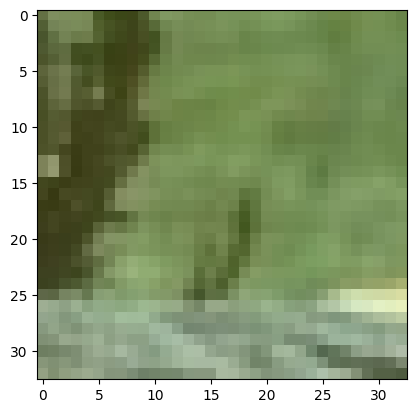

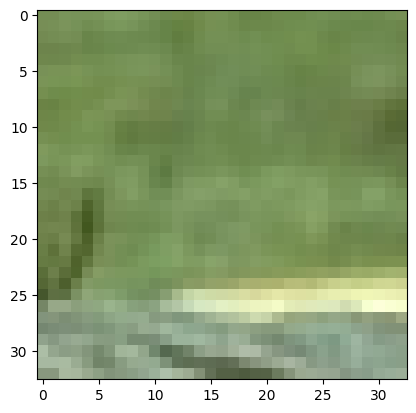

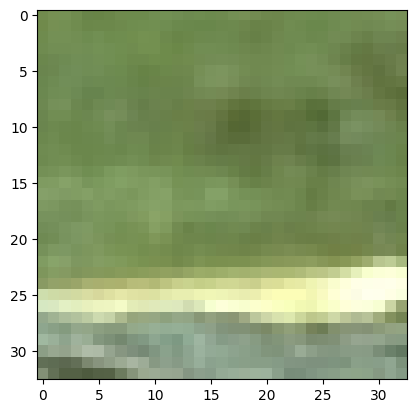

In [ ]:
#Visualise patches

sub_image_size = 33
stride = 14

img = cv2.imread(train_images[0])

sub_image_patches = []

for horizontal in range(0, img.shape[0] - sub_image_size, stride):
    for vertical in range(0, img.shape[1] - sub_image_size, stride):
        sub_image_patches.append(img[horizontal:horizontal+sub_image_size, vertical:vertical+sub_image_size])

for sub_image_patch in sub_image_patches:
    plt.imshow(sub_image_patch[:,:,::-1])
    plt.show()


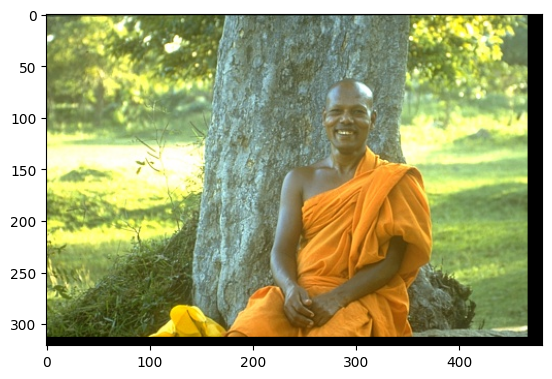

In [ ]:
#Combine patches

index = 0
img_reconstructed = np.zeros((img.shape[0], img.shape[1], 3))
for horizontal in range(0, img.shape[0] - sub_image_size, stride):
    for vertical in range(0, img.shape[1] - sub_image_size, stride):
        img_reconstructed[horizontal:horizontal+sub_image_size , vertical:vertical+sub_image_size] = sub_image_patches[index]
        index += 1

img_reconstructed = img_reconstructed.astype(np.uint8)
plt.imshow(img_reconstructed[:,:,::-1])
plt.show()

In [ ]:
cv2.imwrite("test.jpg",sub_image_patches[180])

True

In [ ]:
train_images = glob.glob("/content/BSDS300/images/train/*.jpg")
test_images  = glob.glob("/content/BSDS300/images/test/*.jpg")



[page 6 of research paper](https://arxiv.org/pdf/1501.00092v3)

```
To synthesize the low-resolution
samples {Yi}, we blur a sub-image by a Gaussian kernel,
sub-sample it by the upscaling factor, and upscale it by
the same factor via bicubic interpolation.
```

In [ ]:

sub_image_size = 33
stride = 14

kernel_size = 7
sigma = 0
sampling_factor = 3


def create_dataset(images, sub_image_size, stride, folder):
    """
    Creates a dataset of sub-images from a list of images, using multiprocessing.

    Args:
        images (list): List of paths to input images.
        sub_image_size (int): Size of the square sub-images.
        stride (int): Stride for extracting sub-images.
        folder (str): Path to the output folder.
    """
    if not os.path.exists(folder):
        os.makedirs(folder)

    data_set = folder.split("/")[-1]

    # Use a pool of worker processes.  Use all available CPUs.
    with Pool(processes=cpu_count()) as pool:
        # Wrap the images list with tqdm to show progress
        image_paths = [(image_path, sub_image_size, stride, folder) for image_path in images]
        for _ in tqdm(pool.starmap(_process_image, image_paths), total=len(images), desc=f"Processing Images for {data_set}"):
            pass


def _process_image(image_path, sub_image_size, stride, folder):
    """
    Helper function to process a single image.  This is called by the worker processes.

    Args:
        image_path (str): Path to the input image.
        sub_image_size (int): Size of the square sub-images.
        stride (int): Stride for extracting sub-images.
        folder (str): Path to the output folder.
    """
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not read image {image_path}")
        return  # Important: Exit the function if the image cannot be read

    for horizontal in range(0, img.shape[0] - sub_image_size, stride):
        for vertical in range(0, img.shape[1] - sub_image_size, stride):
            image_new_name = image_path.split("/")[-1].split(".")[0]
            file_name_hr = f"{folder}/{horizontal//stride}_{vertical//stride}_{image_new_name}_hr.jpg"
            img_hr = img[horizontal:horizontal+sub_image_size, vertical:vertical+sub_image_size]
            cv2.imwrite(file_name_hr ,img_hr)

            file_name_lr = f"{folder}/{horizontal//stride}_{vertical//stride}_{image_new_name}_lr.jpg"
            # Gaussian blur then sampling then resizing using INTER_CUBIC
            img_lr = cv2.resize(
                                cv2.GaussianBlur(
                                                img_hr, (kernel_size, kernel_size), sigma)[::sampling_factor, ::sampling_factor] ,
                                (sub_image_size,sub_image_size) , interpolation=cv2.INTER_CUBIC)

            cv2.imwrite(file_name_lr ,img_lr)




In [ ]:
!rm -rf /content/dataset/

In [ ]:
folder = "/content/dataset/train"

create_dataset(train_images, sub_image_size, stride, folder)

Processing Images for train:   0%|          | 0/200 [00:00<?, ?it/s]

In [ ]:
folder = "/content/dataset/test"

create_dataset(test_images, sub_image_size, stride, folder)

Processing Images for test:   0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
cv2.imread("/content/BSDS300/images/train/376020.jpg").shape

(321, 481, 3)

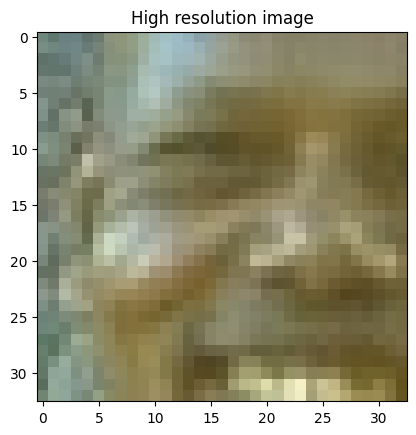

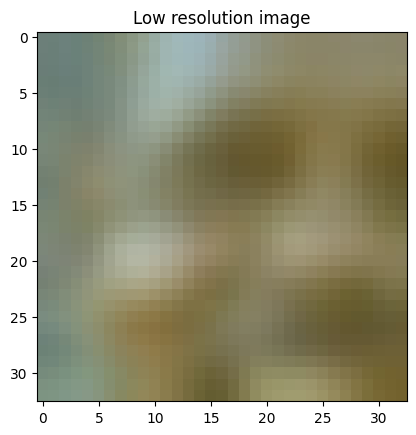

In [ ]:
plt.imshow(cv2.imread("/content/dataset/train/6_19_376020_hr.jpg")[:,:,::-1])
plt.title("High resolution image")
plt.show()
plt.imshow(cv2.imread("/content/dataset/train/6_19_376020_lr.jpg")[:,:,::-1])
plt.title("Low resolution image")
plt.show()


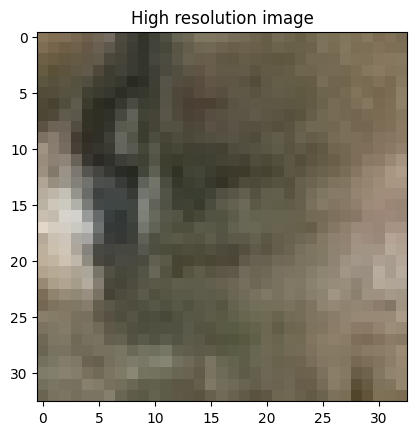

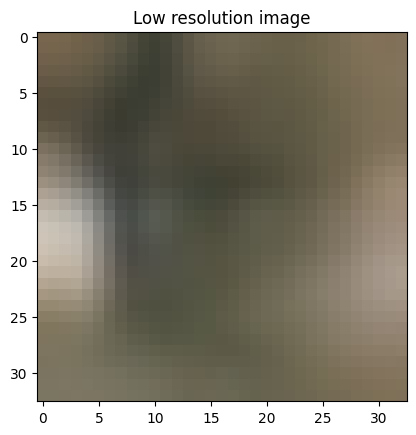

In [ ]:
plt.imshow(cv2.imread("/content/dataset/test/12_15_105025_hr.jpg")[:,:,::-1])
plt.title("High resolution image")
plt.show()
plt.imshow(cv2.imread("/content/dataset/test/12_15_105025_lr.jpg")[:,:,::-1])
plt.title("Low resolution image")
plt.show()


In [ ]:
print(len(glob.glob("/content/dataset/train/*.jpg")))
print(len(glob.glob("/content/dataset/test/*.jpg")))

268800
134400


In [ ]:
!zip -r dataset.zip dataset

Streaming output truncated to the last 5000 lines.
  adding: dataset/test/3_10_170057_lr.jpg (deflated 22%)
  adding: dataset/test/19_11_65033_hr.jpg (deflated 13%)
  adding: dataset/test/15_9_253027_lr.jpg (deflated 18%)
  adding: dataset/test/23_11_54082_hr.jpg (deflated 11%)
  adding: dataset/test/0_29_42049_lr.jpg (deflated 25%)
  adding: dataset/test/6_26_14037_hr.jpg (deflated 18%)
  adding: dataset/test/15_11_86016_hr.jpg (deflated 11%)
  adding: dataset/test/9_17_108082_lr.jpg (deflated 16%)
  adding: dataset/test/18_26_147091_lr.jpg (deflated 22%)
  adding: dataset/test/6_12_376043_hr.jpg (deflated 13%)
  adding: dataset/test/22_11_89072_hr.jpg (deflated 11%)
  adding: dataset/test/27_15_101087_lr.jpg (deflated 19%)
  adding: dataset/test/16_7_291000_lr.jpg (deflated 18%)
  adding: dataset/test/17_8_89072_lr.jpg (deflated 17%)
  adding: dataset/test/25_8_271035_lr.jpg (deflated 20%)
  adding: dataset/test/23_5_148026_lr.jpg (deflated 19%)
  adding: dataset/test/5_20_123074_hr.

In [ ]:
!cp dataset.zip /content/drive/MyDrive/deep_learning_research/Image_Super_Resolution_Using_Deep_Convolutional_Networks/data